# Test dist sampling and its effect on the samples

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os

sc.set_figure_params(figsize=(8,8), fontsize=15, )
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
import warnings
warnings.filterwarnings("ignore")

/home/ekarimi/miniconda3/envs/facs_sampling/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.26.0 scipy==1.11.4 pandas==2.1.1 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.11.3 pynndescent==0.5.11


In [2]:
# Get the file path from the environment variable
file_path_env = os.getenv('MY_FACS_DATA_PATH')
input_file1 = os.path.join(file_path_env,'sara_data',"adata_ref_sara_2M.h5ad")
input_file2 = os.path.join(file_path_env,'sara_data', 'reps',"random_adata_2_30__0.h5ad")
input_file3 = os.path.join(file_path_env,'sara_data', 'reps',"fsbs_adata_2_30__0.h5ad")

# adata_ref = sc.read_h5ad(input_file1)
adata_random = sc.read_h5ad(input_file2)
adata_random.obs.reset_index(drop=True, inplace=True)
# adata_fsbs =  sc.read_h5ad(input_file3)

In [3]:
from FACS_Sampling.methods.methods import bin_sample, sample_random
seed = 12345
np.random.seed(seed)
new_seed = np.random.randint(100000)

ps, _ = bin_sample(adata_random, n_bins=20, s_size=100, seed=new_seed)
rs = sample_random(adata_random, s_size=ps.size, seed=new_seed)
ad_random = adata_random[rs]
ad_fsbs = adata_random[ps]

In [4]:
samples = np.unique(np.concatenate([ps,rs]))

In [5]:
ad_int = adata_random[samples].copy()

In [6]:
sc.pp.neighbors(ad_int, n_neighbors=10)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)


In [7]:
sc.tl.umap(ad_int)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:29)


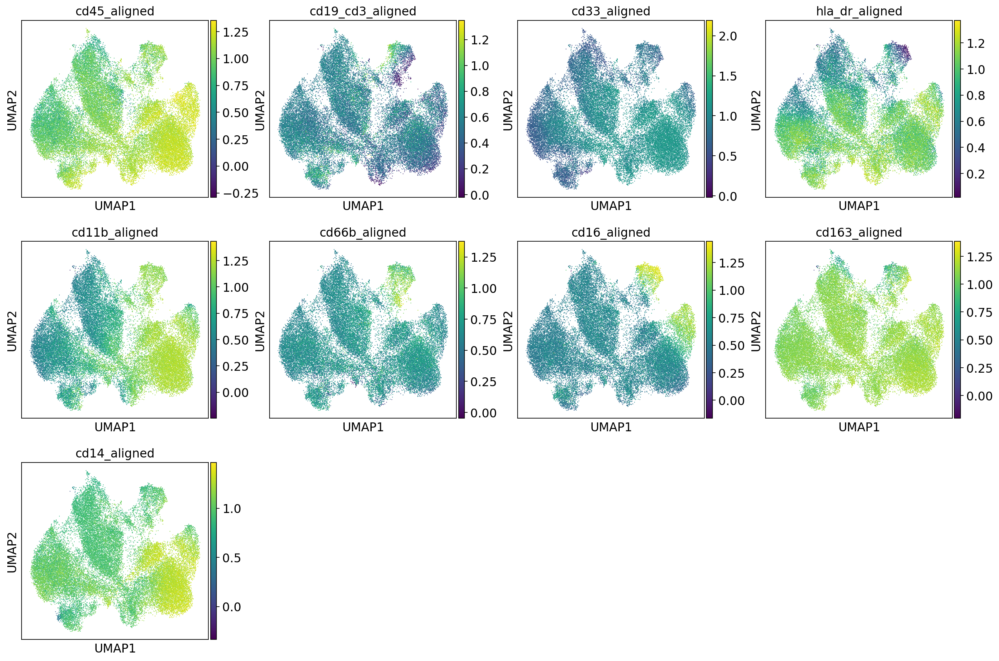

In [8]:
sc.pl.umap(ad_int, color=['cd45_aligned', 'cd19_cd3_aligned', 'cd33_aligned', 'hla_dr_aligned', 'cd11b_aligned', 'cd66b_aligned', 'cd16_aligned', 'cd163_aligned', 'cd14_aligned'])


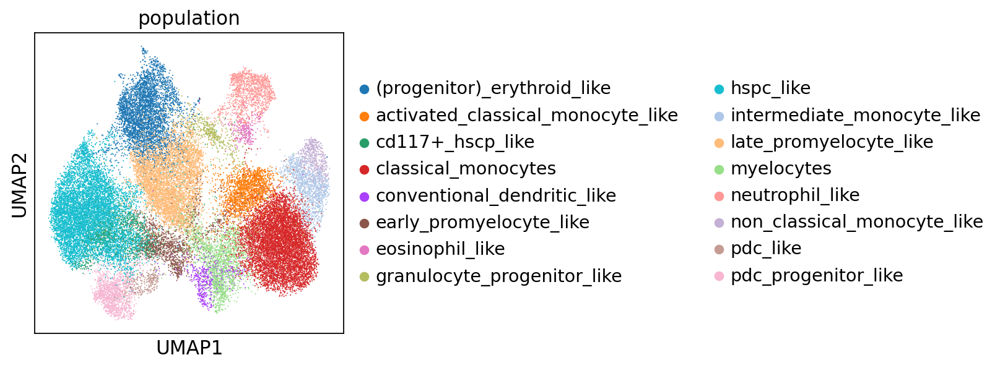

In [9]:
sc.pl.umap(ad_int, color=['population'])


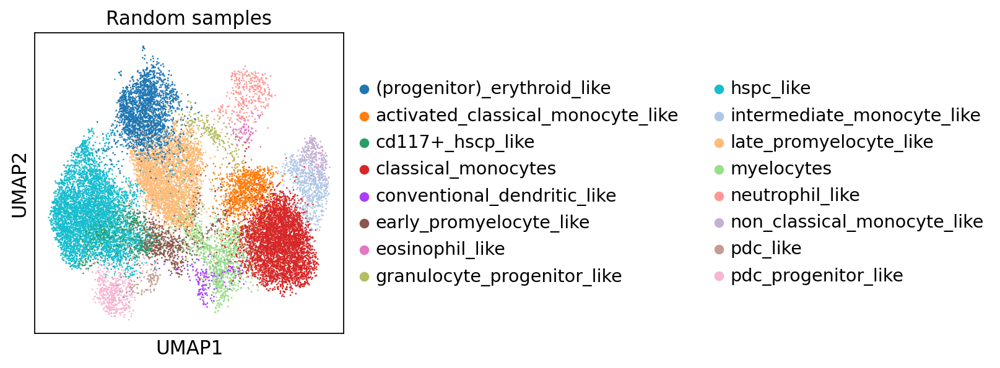

In [10]:
rs_str = rs.astype(str)
sc.pl.umap(ad_int[ad_int.obs.loc[rs_str].index], color=['population'], title= 'Random samples')


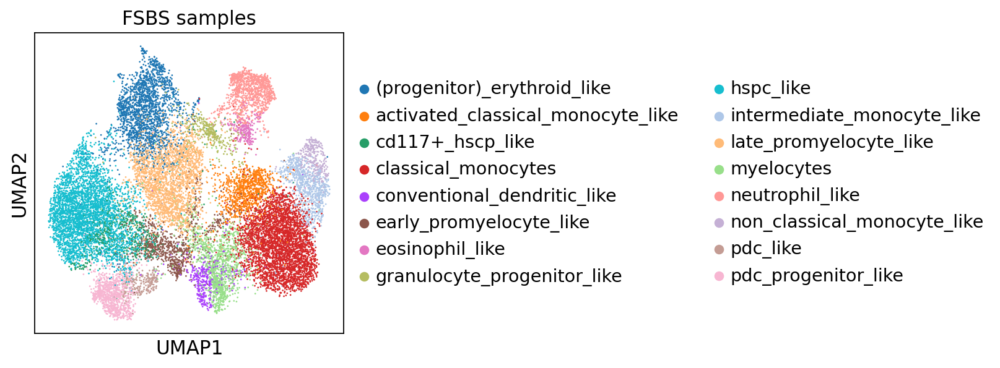

In [11]:
ps_str = ps.astype(str)
sc.pl.umap(ad_int[ad_int.obs.loc[ps_str].index], color=['population'], title= 'FSBS samples')


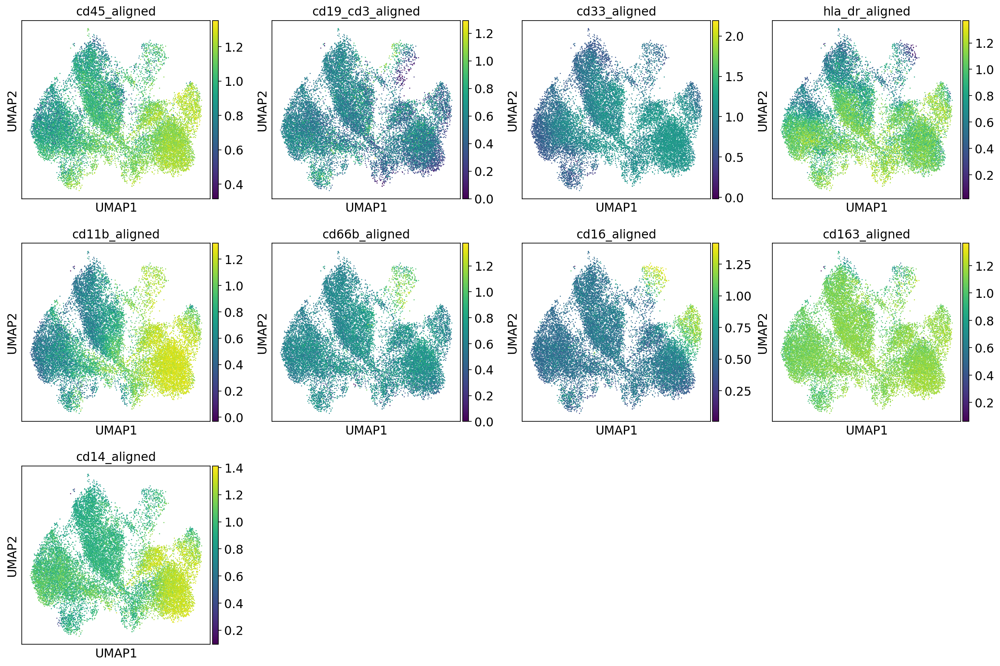

In [12]:
sc.pl.umap(ad_int[ad_int.obs.loc[rs_str].index], color=['cd45_aligned', 'cd19_cd3_aligned', 'cd33_aligned', 'hla_dr_aligned', 'cd11b_aligned', 'cd66b_aligned', 'cd16_aligned', 'cd163_aligned', 'cd14_aligned'])


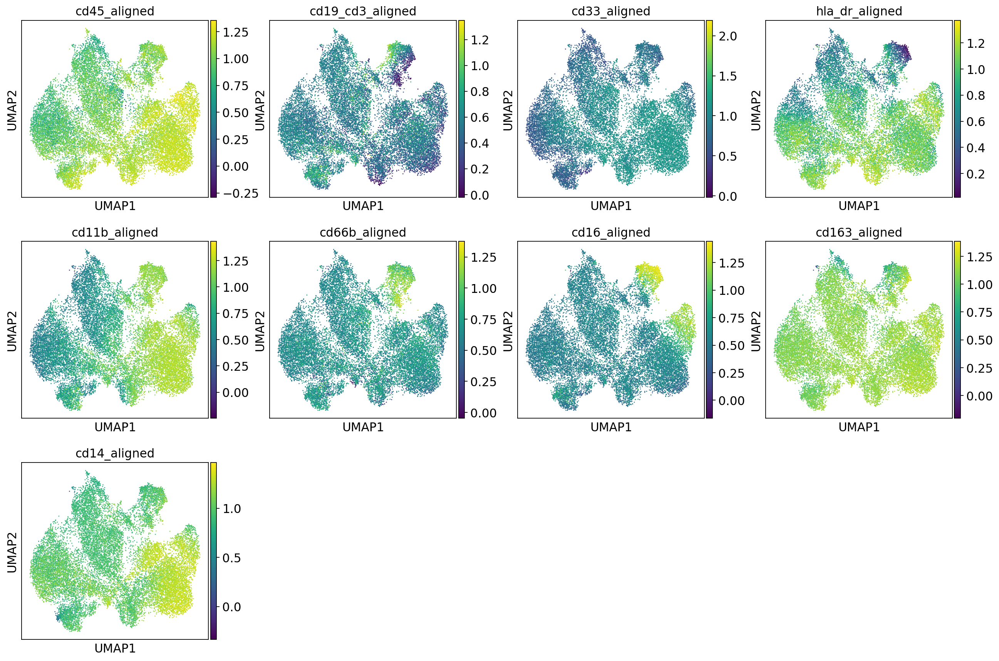

In [13]:
sc.pl.umap(ad_int[ad_int.obs.loc[ps_str].index], color=['cd45_aligned', 'cd19_cd3_aligned', 'cd33_aligned', 'hla_dr_aligned', 'cd11b_aligned', 'cd66b_aligned', 'cd16_aligned', 'cd163_aligned', 'cd14_aligned'])


In [14]:
len(rs)

20060

In [16]:
adata_random

AnnData object with n_obs × n_vars = 121676 × 22
    obs: 'old_index', 'unique_id', 'sex', 'age', 'subtype', 'type', 'blastcount', 'survival_sorter', 'run', 'sample_id', 'alignment_mc_aligned', 'flowsom_cluster', 'flowsom_metacluster', 'population'

In [ ]:
def dist_sampling(adata, sample_per_matrix=4, rng=1000, seed=12345):
    adata.obs = adata.obs.reset_index()
    np.random.seed(seed)
    all_indices = adata.obs.index.to_numpy().astype(int)
    np.random.shuffle(all_indices)

    start_i = 0
    if all_indices.shape[0] % rng != 0:
        end_of_range = int(all_indices.shape[0] / rng + 1)
    else:
        end_of_range = int(all_indices.shape[0] / rng)

    output = []
    for i in range(end_of_range):
        samples = all_indices[start_i:start_i + rng]
        start_i += rng

        x = adata.X[samples,]
        # x = stats.zscore(x, axis=1)
        dists = squareform(pdist(x, metric='euclidean'))
        th = np.max(dists)
        mask1 = dists > th
        while (mask1.sum(axis=1) > 0).sum() < 5 * sample_per_matrix:
            th = th / 2
            mask1 = dists > th

        mask = mask1

        fin_scores = np.multiply(dists, mask).sum(axis=0)
        t = samples[np.argsort(fin_scores)[0:sample_per_matrix]]
        output.extend(t)

    output = adata.obs.loc[output]['index'].values
    adata.obs.index = adata.obs['index']
    del adata.obs['index']
    return np.array(output)

## Checking out the distance sampling method

In [6]:
from scipy.spatial.distance import pdist, squareform

In [13]:
adata = adata_random.copy()
adata


AnnData object with n_obs × n_vars = 121676 × 22
    obs: 'old_index', 'unique_id', 'sex', 'age', 'subtype', 'type', 'blastcount', 'survival_sorter', 'run', 'sample_id', 'alignment_mc_aligned', 'flowsom_cluster', 'flowsom_metacluster', 'population'

In [14]:
121676/100

1216.76

In [15]:
sample_per_matrix=36
rng=200
seed=12345

In [16]:
adata.obs = adata.obs.reset_index()
np.random.seed(seed)
all_indices = adata.obs.index.to_numpy().astype(int)
np.random.shuffle(all_indices)

In [17]:
if all_indices.shape[0] % rng != 0:
    end_of_range = int(all_indices.shape[0] / rng + 1)
else:
    end_of_range = int(all_indices.shape[0] / rng)
output1 = []
output2 = []
output3 = []

In [18]:
start_i = 0
for i in range(end_of_range):
    samples = all_indices[start_i:start_i + rng]
    start_i += rng

    x = adata.X[samples,]
    # x = stats.zscore(x, axis=1)
    dists = squareform(pdist(x, metric='euclidean'))
    th = np.max(dists)
    mask1 = dists > th
    while (mask1.sum(axis=1) > 0).sum() < 5 * sample_per_matrix:
        th = th / 2
        mask1 = dists > th

    mask = mask1

    fin_scores = np.multiply(dists, mask).sum(axis=0)
    t = samples[np.argsort(fin_scores)[0:sample_per_matrix]]
    output1.extend(t)



KeyboardInterrupt: 

In [ ]:
len(output1)

In [171]:
adata_random[samples].obs['population'].value_counts()

population
classical_monocytes                  24
late_promyelocyte_like               11
hspc_like                            11
(progenitor)_erythroid_like          10
activated_classical_monocyte_like     5
myelocytes                            4
cd117+_hscp_like                      3
neutrophil_like                       2
intermediate_monocyte_like            2
conventional_dendritic_like           1
early_promyelocyte_like               1
non_classical_monocyte_like           1
pdc_progenitor_like                   1
Name: count, dtype: int64

In [172]:
adata_random[output1].obs['population'].value_counts()

population
late_promyelocyte_like               4135
myelocytes                            455
hspc_like                             335
(progenitor)_erythroid_like           323
activated_classical_monocyte_like     224
classical_monocytes                   175
cd117+_hscp_like                      148
early_promyelocyte_like               123
granulocyte_progenitor_like           119
conventional_dendritic_like            44
non_classical_monocyte_like             7
eosinophil_like                         1
neutrophil_like                         1
Name: count, dtype: int64

In [173]:
start_i = 0
for i in range(end_of_range):
    samples = all_indices[start_i:start_i + rng]
    start_i += rng

    x = adata.X[samples,]
    x = stats.zscore(x, axis=1)
    corr = np.corrcoef(x, rowvar=True)

    
#     dists = squareform(pdist(x, metric='euclidean'))
#     th = np.max(dists)
#     mask1 = dists > th
#     while (mask1.sum(axis=1) > 0).sum() < 5 * sample_per_matrix:
#         th = th / 2
#         mask1 = dists > th

#     mask = mask1

    fin_scores = corr.sum(axis=0)
    
    t = samples[np.argsort(fin_scores)[0:sample_per_matrix]]
    output2.extend(t)

In [174]:
adata_random[output2].obs['population'].value_counts()

population
neutrophil_like                      1721
hspc_like                            1083
pdc_progenitor_like                   905
(progenitor)_erythroid_like           648
non_classical_monocyte_like           288
granulocyte_progenitor_like           284
eosinophil_like                       224
intermediate_monocyte_like            198
classical_monocytes                   179
late_promyelocyte_like                169
cd117+_hscp_like                      144
myelocytes                            115
pdc_like                               52
conventional_dendritic_like            30
activated_classical_monocyte_like      26
early_promyelocyte_like                24
Name: count, dtype: int64

In [180]:
start_i = 0
for i in range(end_of_range):
    samples = all_indices[start_i:start_i + rng]
    start_i += rng

    x = adata.X[samples,]
    x = stats.zscore(x, axis=1)
    corr = np.corrcoef(x, rowvar=True)

    
#     dists = squareform(pdist(x, metric='euclidean'))
#     th = np.max(dists)
    mask1 = corr < 0
#     while (mask1.sum(axis=1) > 0).sum() < 5 * sample_per_matrix:
#         th = th / 2
#         mask1 = dists > th

    mask = mask1

    fin_scores = corr.sum(axis=0)
    
    t = samples[np.argsort(fin_scores)[0:sample_per_matrix]]
    output3.extend(t)

In [182]:
len(output3)

6090

In [175]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scanpy as sc

def plot_improved_population_distribution(adata_list, labels, adata_ref):
    # Create a DataFrame to hold the count data
    pop_counts = pd.DataFrame({
        label: adata.obs['population'].value_counts(normalize=True) * 100
        for adata, label in zip(adata_list, labels)
    })

    # Sort the populations based on the counts in adata_ref
    ref_order = adata_ref.obs['population'].value_counts().index
    pop_counts = pop_counts.reindex(ref_order)

    # Create the bar plot
    fig, ax = plt.subplots(figsize=(12, 6))
    n = len(pop_counts.columns)
    bar_width = 0.8 / n
    indices = np.arange(len(pop_counts))

    for i, label in enumerate(labels):
        ax.bar(indices + i * bar_width, pop_counts[label], bar_width, label=label)

    # Improve the aesthetics
    ax.set_xlabel('Population', fontsize=12)
    ax.set_ylabel('Percentage (%)', fontsize=12)
    ax.set_xticks(indices + bar_width * (n - 1) / 2)
    ax.set_xticklabels(pop_counts.index, rotation=45, ha='right', fontsize=10)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

# Example usage


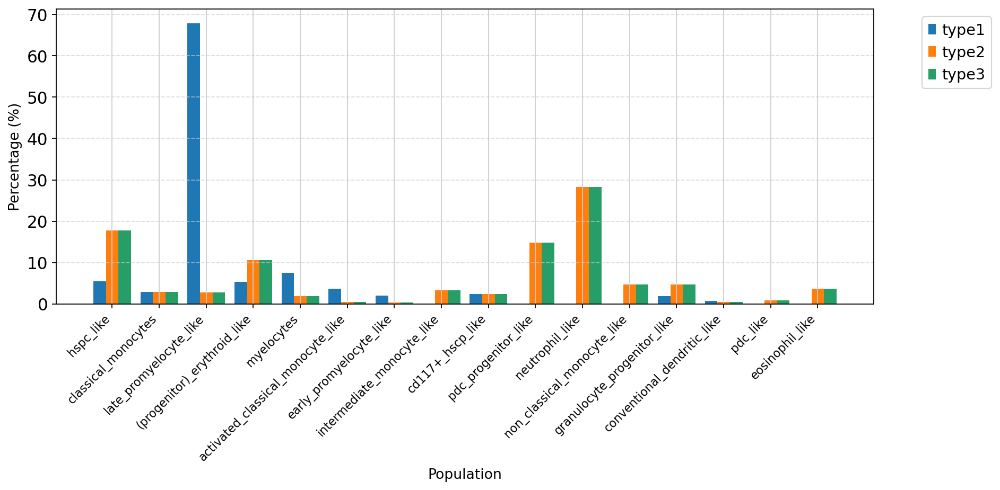

In [181]:
plot_improved_population_distribution([adata_random[output1], adata_random[output2], adata_random[output3]], ['type1', 'type2', 'type3'], adata_random)

In [ ]:
output = adata.obs.loc[output]['index'].values
adata.obs.index = adata.obs['index']
del adata.obs['index']
return np.array(output)

In [86]:
import numpy as np
import pandas as pd

# Generating a mock dataset
np.random.seed(0)  # For reproducibility

# Let's create a dataset with 100 observations and 5 features
num_observations = 100
num_features = 5

# Generate random data
data = np.random.randn(num_observations, num_features)

# Convert to a pandas DataFrame for ease of use
mock_data = pd.DataFrame(data, columns=[f'Feature_{i+1}' for i in range(num_features)])

mock_data.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5
0,1.764052,0.400157,0.978738,2.240893,1.867558
1,-0.977278,0.950088,-0.151357,-0.103219,0.410599
2,0.144044,1.454274,0.761038,0.121675,0.443863
3,0.333674,1.494079,-0.205158,0.313068,-0.854096
4,-2.552990,0.653619,0.864436,-0.742165,2.269755


In [90]:
res = stats.zscore(mock_data)

In [94]:
res.mean()

Feature_1    2.466777e-17
Feature_2   -2.220446e-17
Feature_3   -2.220446e-17
Feature_4    3.441691e-17
Feature_5    7.605028e-17
dtype: float64

In [98]:
x.dtype

dtype('float64')

In [102]:
correlation_matrix = np.corrcoef(mock_data, rowvar=True)


In [104]:
correlation_matrix

array([[ 1.        , -0.53471783, -0.94866093, ..., -0.56686784,
         0.38377218,  0.06120557],
       [-0.53471783,  1.        ,  0.77161654, ...,  0.90960494,
         0.32952012, -0.29625389],
       [-0.94866093,  0.77161654,  1.        , ...,  0.75092018,
        -0.19751374, -0.16642455],
       ...,
       [-0.56686784,  0.90960494,  0.75092018, ...,  1.        ,
         0.40141121, -0.49909768],
       [ 0.38377218,  0.32952012, -0.19751374, ...,  0.40141121,
         1.        , -0.02125805],
       [ 0.06120557, -0.29625389, -0.16642455, ..., -0.49909768,
        -0.02125805,  1.        ]])

In [106]:
import seaborn as sns

In [110]:
# # Generating a mock 1000x1000 correlation matrix for demonstration
# np.random.seed(0)
# mock_corr_matrix = np.random.rand(1000, 1000)
# mock_corr_matrix = (mock_corr_matrix + mock_corr_matrix.T) / 2  # Making it symmetric
# np.fill_diagonal(mock_corr_matrix, 1)  # Setting diagonal to 1 for self-correlation

# # Generating mock labels (optional)
# labels = [f"{i+1}" for i in range(1000)]  # Replace with your actual labels if available

# # Function to plot the heatmap
# def plot_correlation_matrix(corr_matrix, labels=None, figsize=(10, 8)):
#     plt.figure(figsize=figsize)
#     ax = sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, xticklabels=labels, yticklabels=labels)
#     plt.title("Heatmap of Correlation Matrix")
#     plt.xlabel("Observation Index")
#     plt.ylabel("Observation Index")
#     plt.show()

# # Plotting the heatmap with labels
# plot_correlation_matrix(mock_corr_matrix, labels=labels)



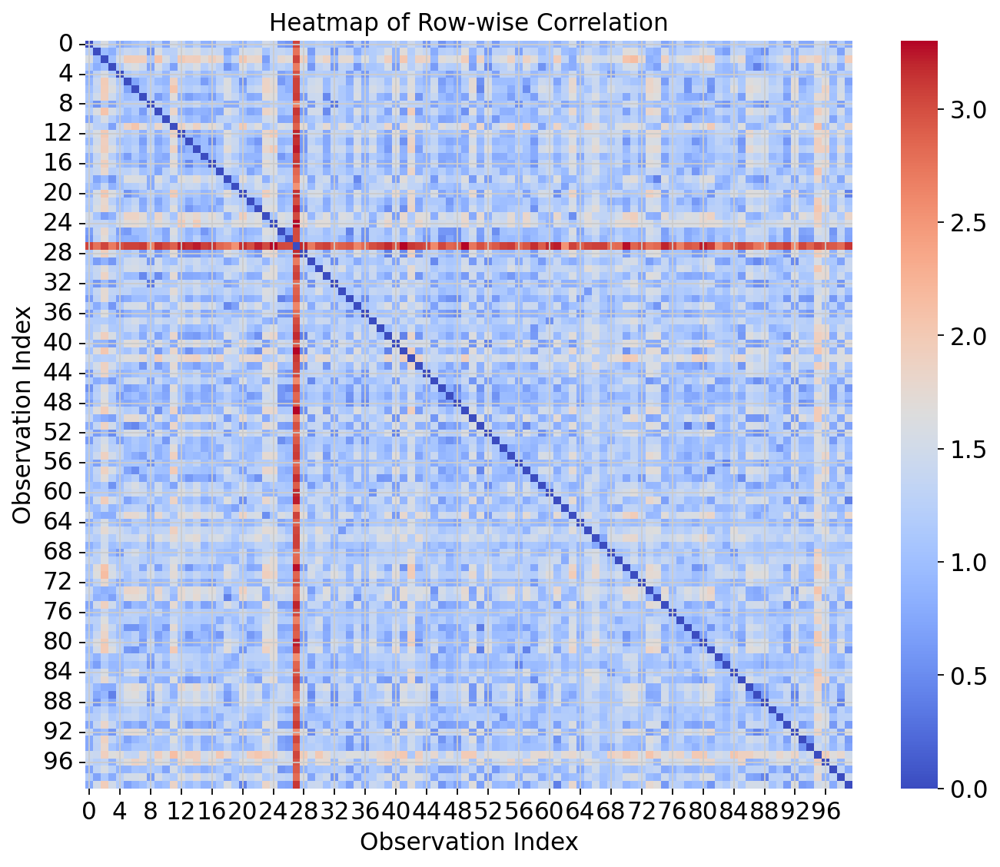

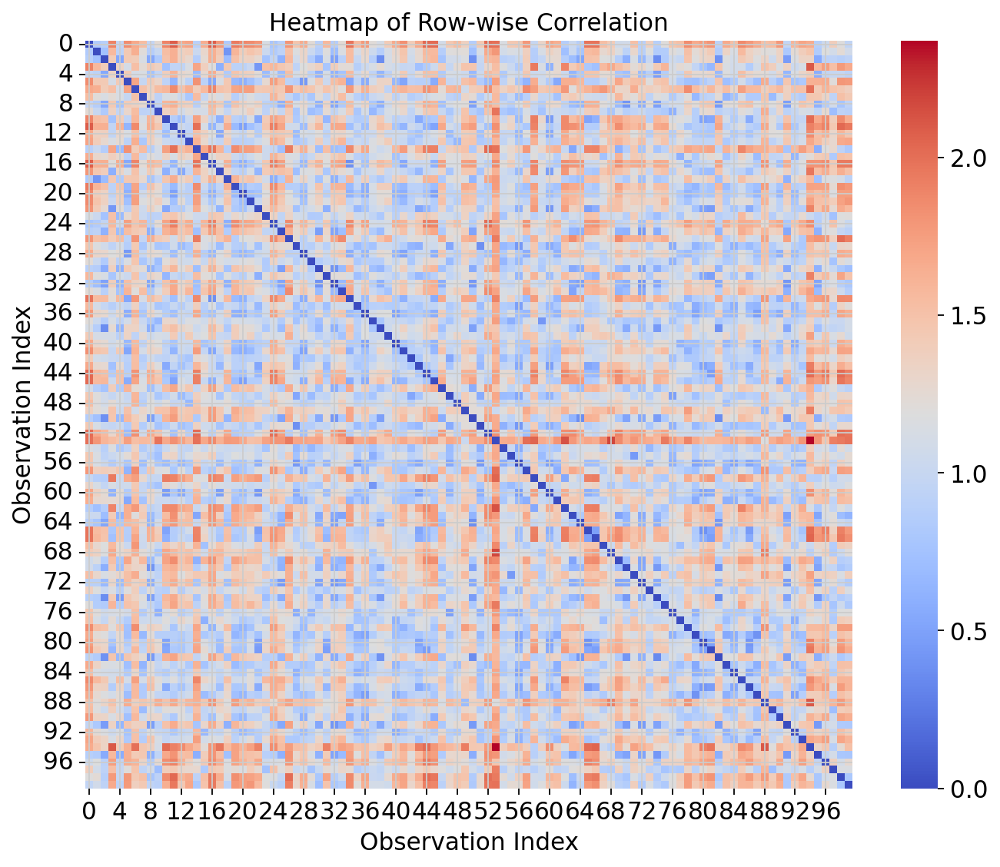

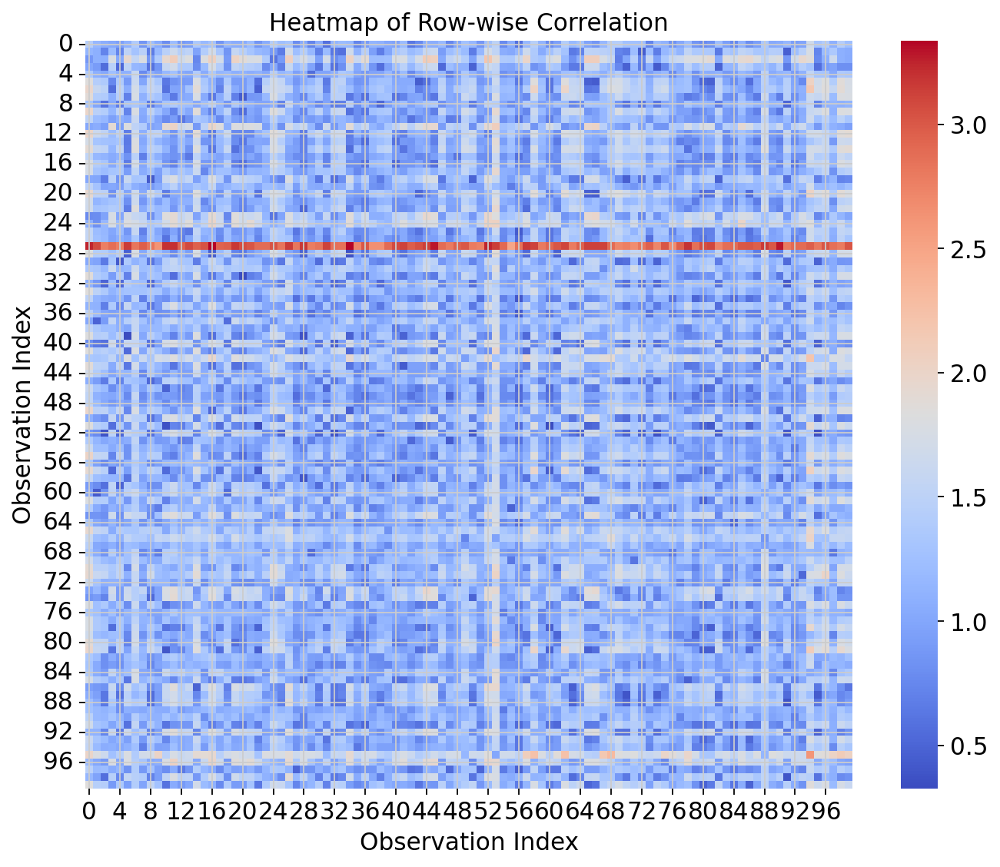

In [121]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'mock_data' is your NumPy array and you want to compute the correlation across rows
correlation_matrix = dists

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[:100,:100], cmap='coolwarm', annot=False)
plt.title("Heatmap of Row-wise Correlation")
plt.xlabel("Observation Index")
plt.ylabel("Observation Index")
plt.show()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[100:200,100:200], cmap='coolwarm', annot=False)
plt.title("Heatmap of Row-wise Correlation")
plt.xlabel("Observation Index")
plt.ylabel("Observation Index")
plt.show()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[:100,100:200], cmap='coolwarm', annot=False)
plt.title("Heatmap of Row-wise Correlation")
plt.xlabel("Observation Index")
plt.ylabel("Observation Index")
plt.show()

In [133]:
corr.shape

(100, 100)

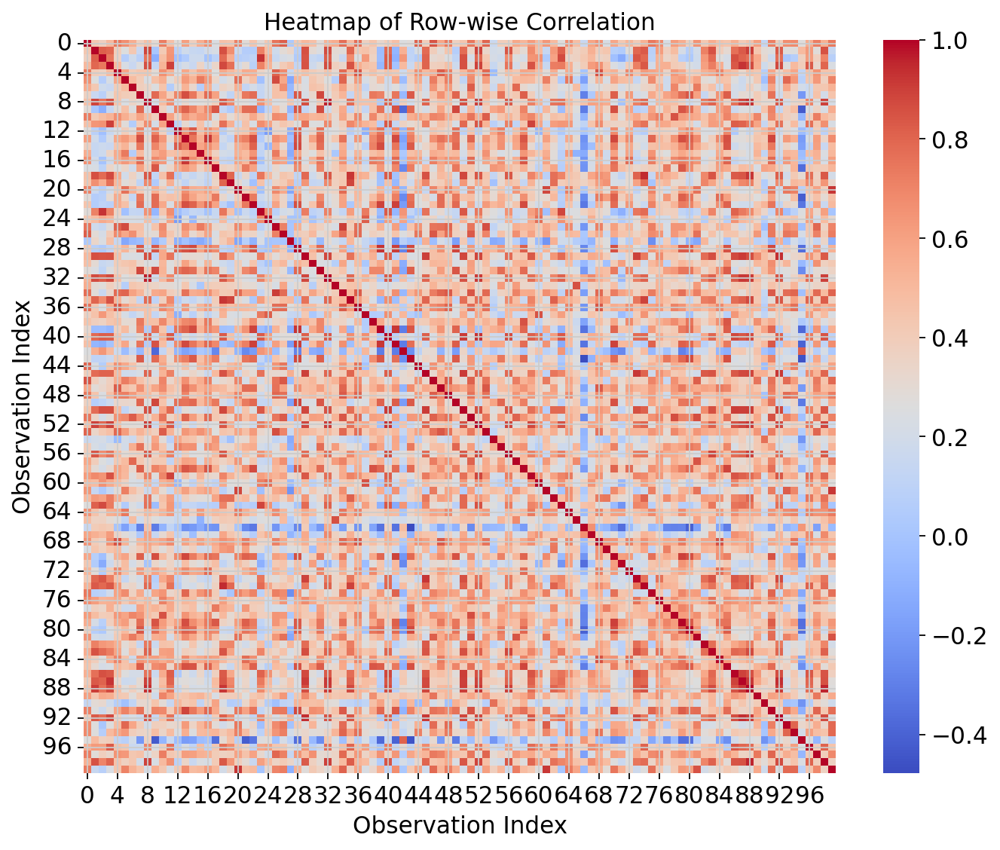

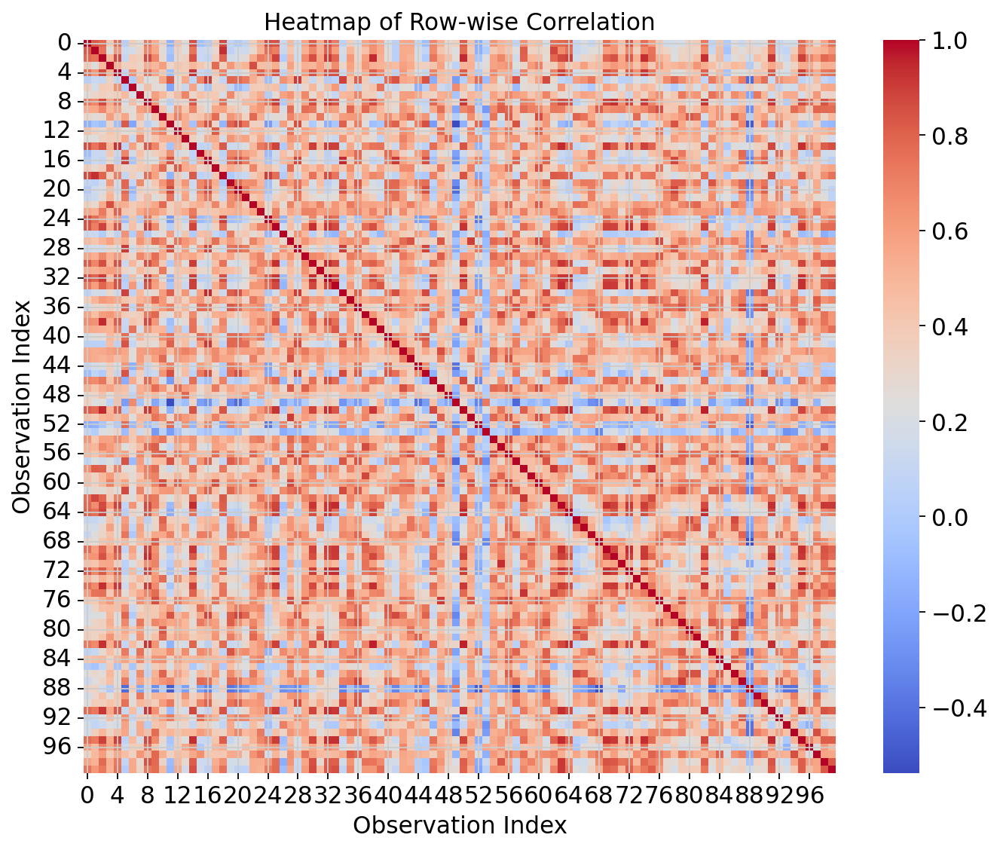

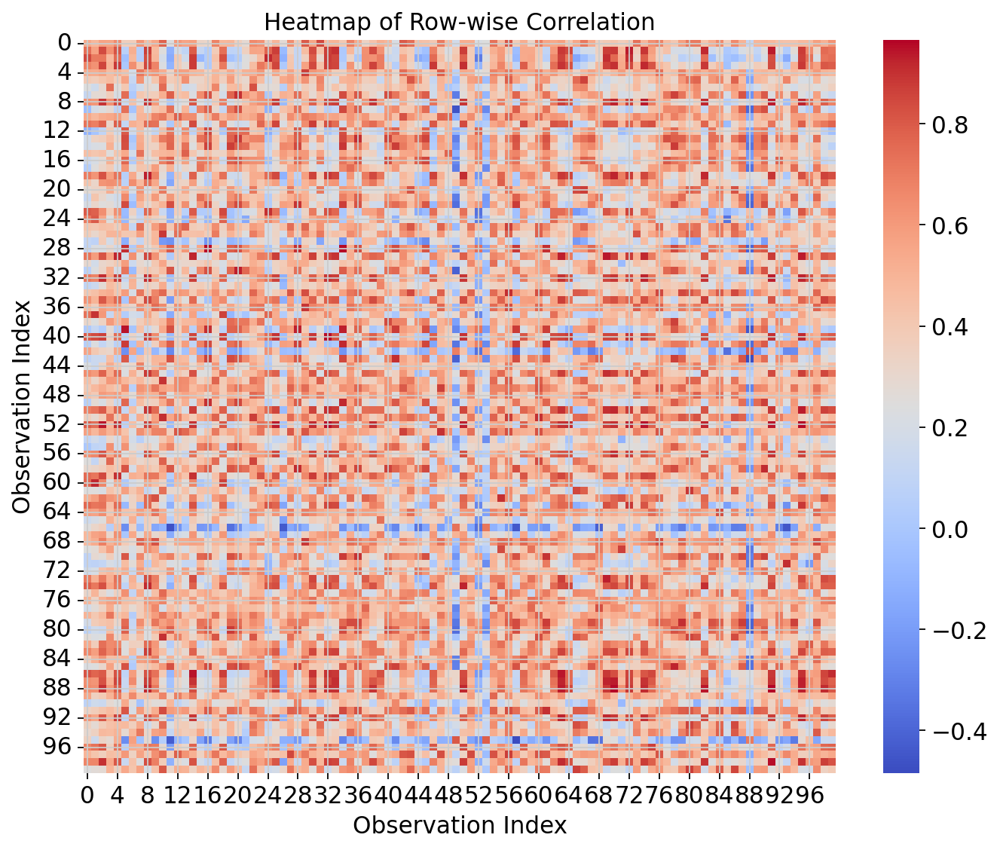

In [135]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'mock_data' is your NumPy array and you want to compute the correlation across rows
correlation_matrix = corr

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[:100,:100], cmap='coolwarm', annot=False)
plt.title("Heatmap of Row-wise Correlation")
plt.xlabel("Observation Index")
plt.ylabel("Observation Index")
plt.show()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[100:200,100:200], cmap='coolwarm', annot=False)
plt.title("Heatmap of Row-wise Correlation")
plt.xlabel("Observation Index")
plt.ylabel("Observation Index")
plt.show()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[:100,100:200], cmap='coolwarm', annot=False)
plt.title("Heatmap of Row-wise Correlation")
plt.xlabel("Observation Index")
plt.ylabel("Observation Index")
plt.show()